In [1]:
import numpy as np
from scipy import optimize
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import signal

import sys
from RadioArray import Array
from Array_methods import VLA_A
#from Array_methods import Y_arm
from Array_methods import Y_arm_power
from Array_methods import get_CleanBeam
from Array_methods import Clean_Hogbom
from Array_methods import con2d
from Array_methods import fitgaussian
from Array_methods import gaussian
from Array_methods import Clean_HB

from SkyObject import Skyobject as so
from ArrayFFT import pixel_data

import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy import optimize
from scipy import signal
from scipy.interpolate import griddata
from scipy.interpolate import  interp2d
from scipy.ndimage import zoom

In [2]:
def gaussian_2D(x_y, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    x, y = x_y
    xo, yo = float(xo), float(yo)
    
    a = np.cos(theta)**2 / (2 * sigma_x**2) + np.sin(theta)**2 / (2 * sigma_y**2)
    b = -np.sin(2 * theta) / (4 * sigma_x**2) + np.sin(2 * theta) / (4 * sigma_y**2)
    c = np.sin(theta)**2 / (2 * sigma_x**2) + np.cos(theta)**2 / (2 * sigma_y**2)
    
    return offset + amplitude * np.exp(-(a * (x - xo)**2 + 2 * b * (x - xo) * (y - yo) + c * (y - yo)**2))

# reshape data
def process_data(data):
    shape = data.shape
    x = np.linspace(0, shape[1] - 1, shape[1])
    y = np.linspace(0, shape[0] - 1, shape[0])
    x, y = np.meshgrid(x, y)

    x_y = np.vstack((x.ravel(), y.ravel()))
    z = data.ravel()
    
    return x_y, z

# fit a gaussian function
def fit_gaussian(data):
    x_y, z = process_data(data)

    # initial value (amplitude, xo, yo, sigma_x, sigma_y, theta, offset)
    initial_guess = (data.max(), data.shape[1] / 2, data.shape[0] / 2, data.shape[1] / 4, data.shape[0] / 4, 0, data.min())

    # use curve_fit to do fitting
    popt, pcov = curve_fit(gaussian_2D, x_y, z, p0=initial_guess)
    
    return popt


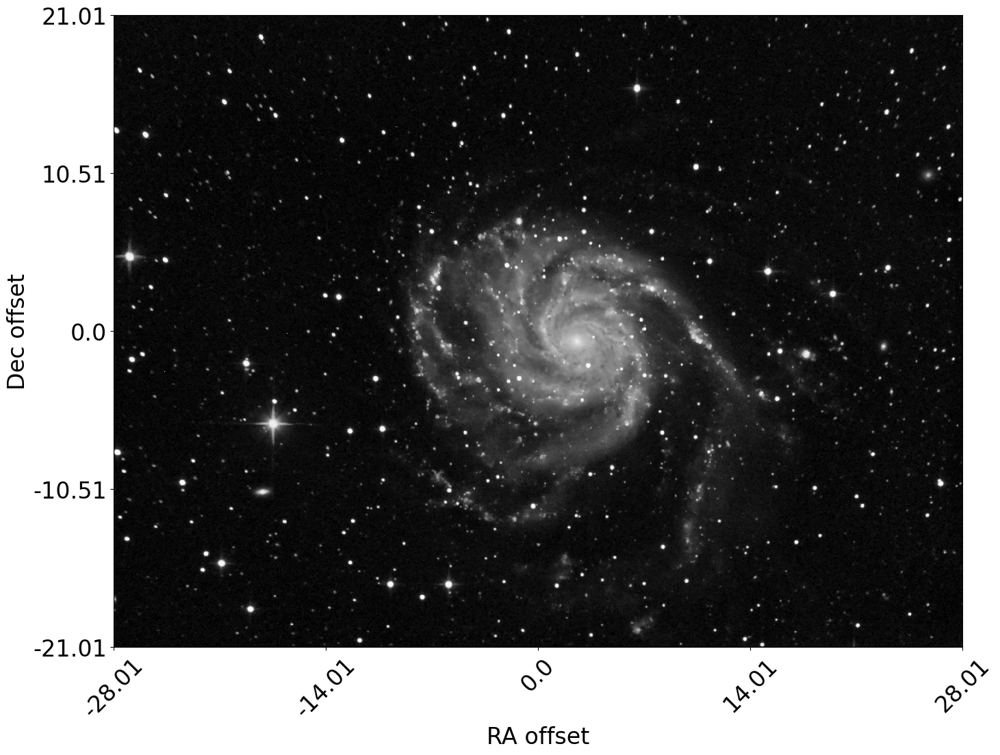

In [3]:
M101 = Image.open("M101.png",mode="r")
M101 = M101.convert("L")
M101 = np.array(M101)
M101 = M101[::-1]

so1 = so(M101)
so1.plot_image()

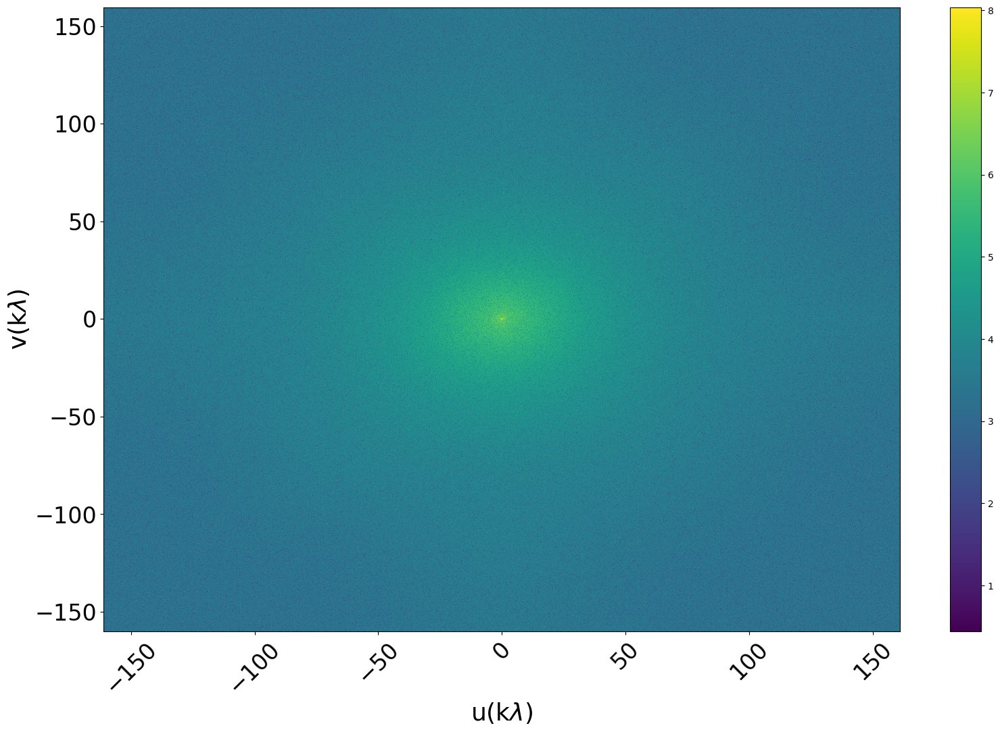

In [4]:
xft,yft,fft2 = so1.plot_FFT(save=False)

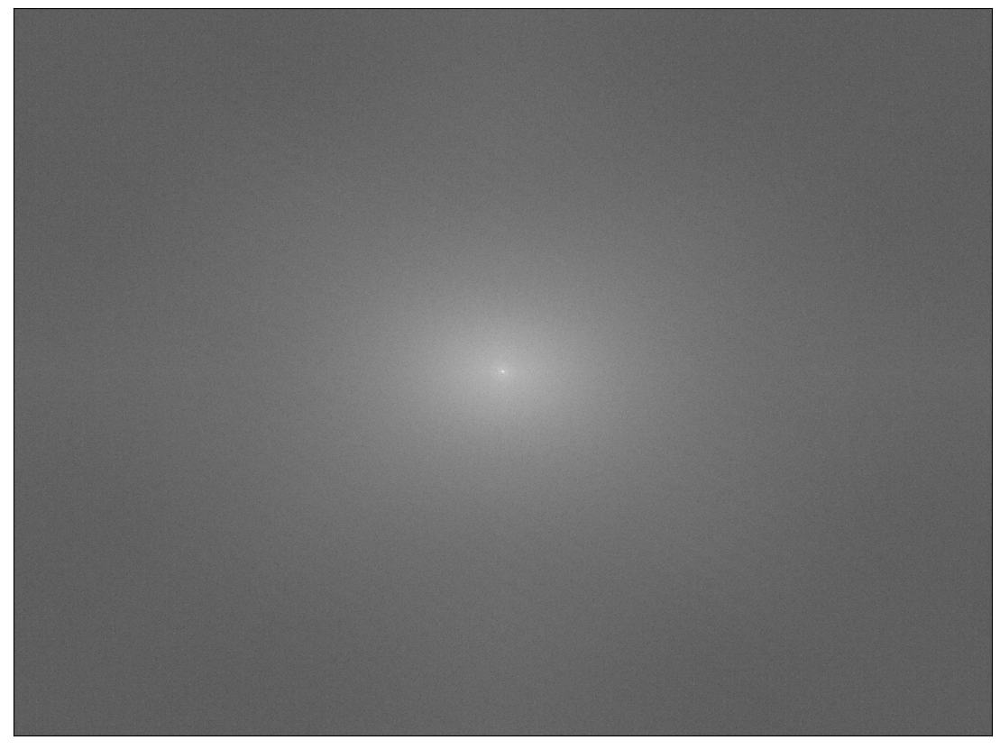

In [5]:
plt.figure(figsize=(14,12))
plt.imshow(np.log10(abs(fft2)),cmap="gray")
plt.xticks([])
plt.yticks([])
plt.show()

Observation location is (Boston:-71.0,42.22).


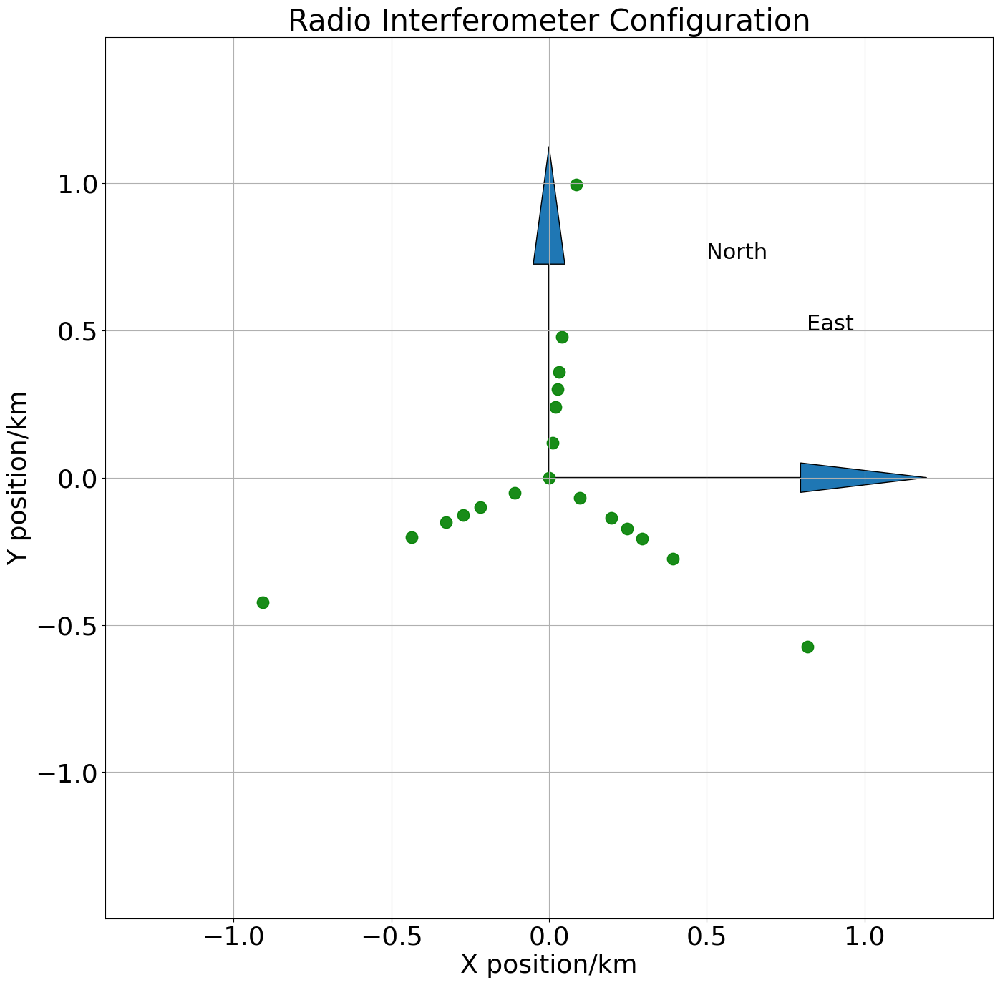

In [6]:
observe_delta = so1.Dec

xa,ya = Y_arm_power(4,4,1.2,0.12)
#xa,ya = VLA_A()
array1= Array(xa,ya)
print(array1)
array1.plot_array(save=False)

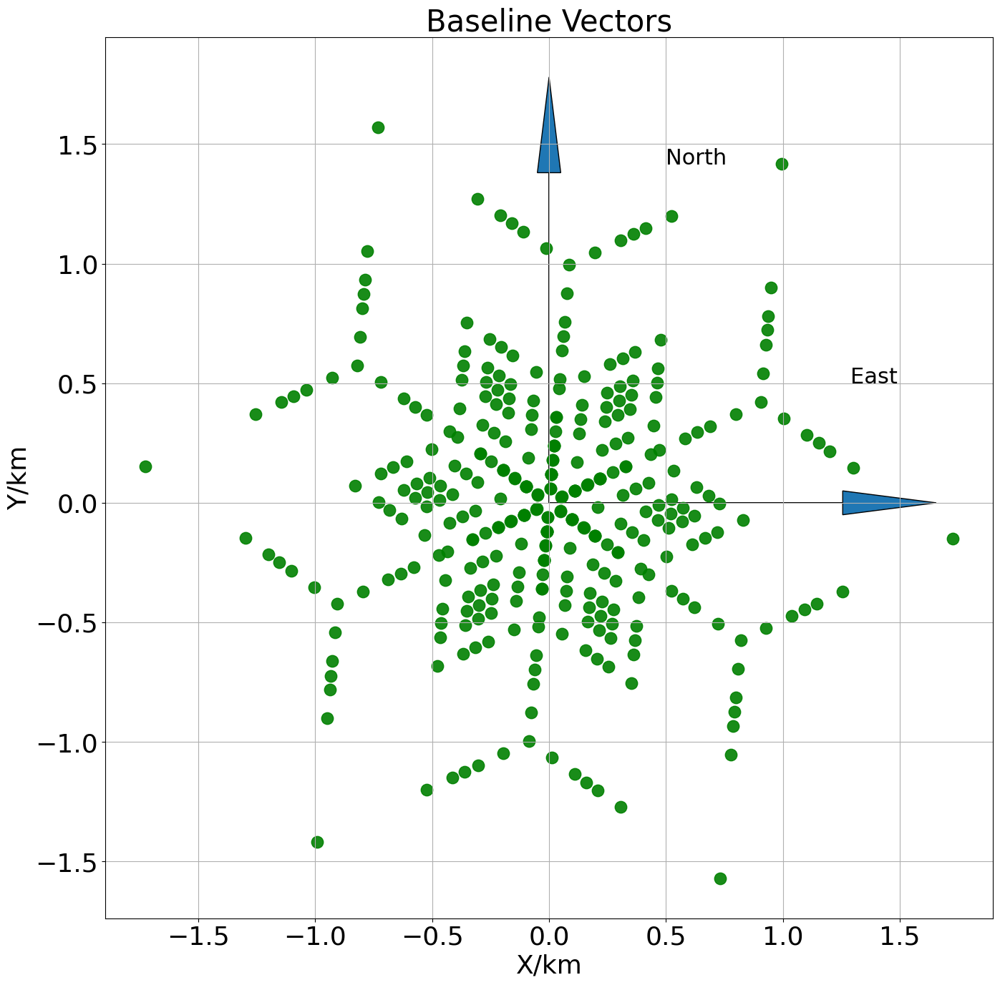

342

In [7]:
array1.plot_vector()
len(array1.xvector)

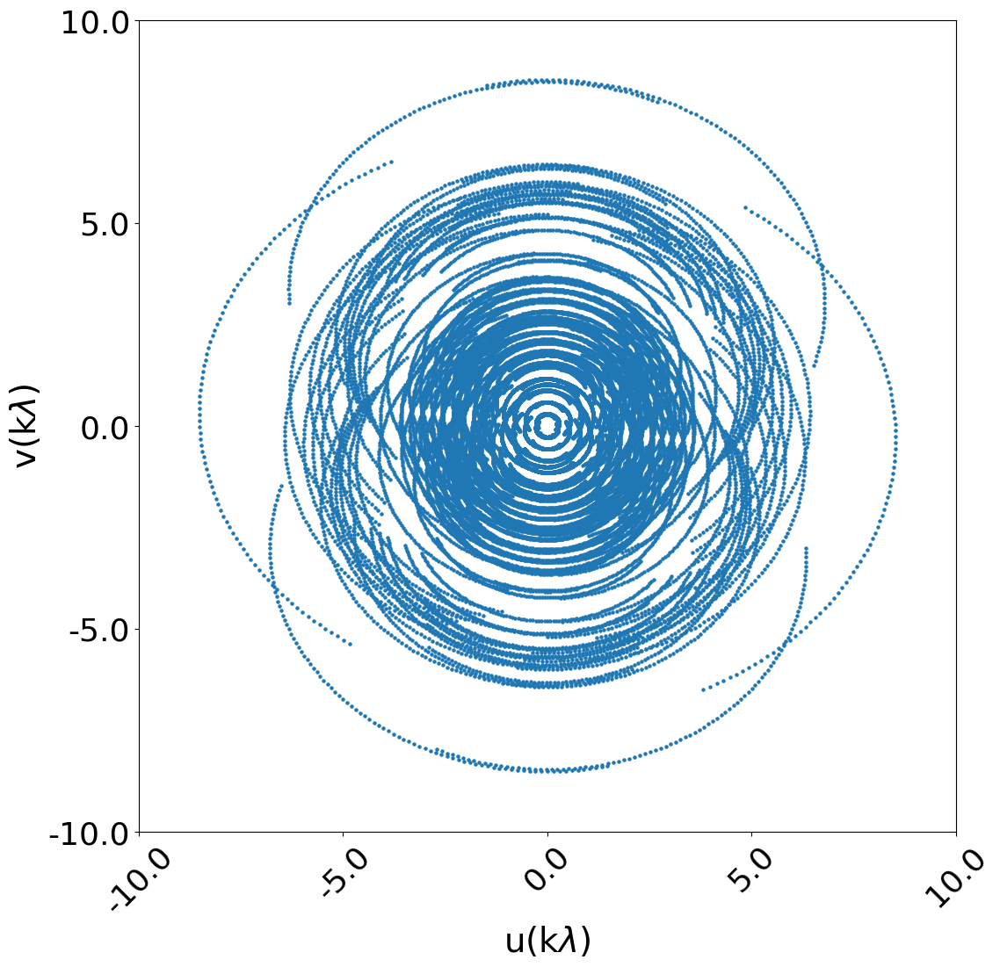

In [8]:
array1.pos2XYZ()
array1.transXYZ2uvw(delta=observe_delta,Hs=-4,He=4,dt=1/12)

fig = plt.figure(figsize=(12,12))
plt.scatter(array1.u,array1.v,s=5)
maxx = max( abs(max(array1.u)),abs(min(array1.u)) )
maxy = max( abs(max(array1.v)),abs(min(array1.v)) )
xlist = np.linspace(-maxx-0.3,maxx+0.3,5)
ylist = np.linspace(-maxy-0.3,maxy+0.3,5)
xshow = np.round(xlist/0.21)
yshow = np.round(ylist/0.21)
plt.xticks(xlist,xshow,fontsize=26,rotation=45)
plt.yticks(ylist,yshow,fontsize=26)
plt.xlabel(r"u(k$\lambda$)",fontsize=28)
plt.ylabel(r"v(k$\lambda$)",fontsize=28)
plt.show()

In [9]:
dx = xft[2] - xft[1]
dy = yft[2] - yft[1]
usize = len(xft)
vsize = len(yft)

uv_sample = pixel_data(dx,dy,usize,vsize,array1.u,array1.v,t=1/12)

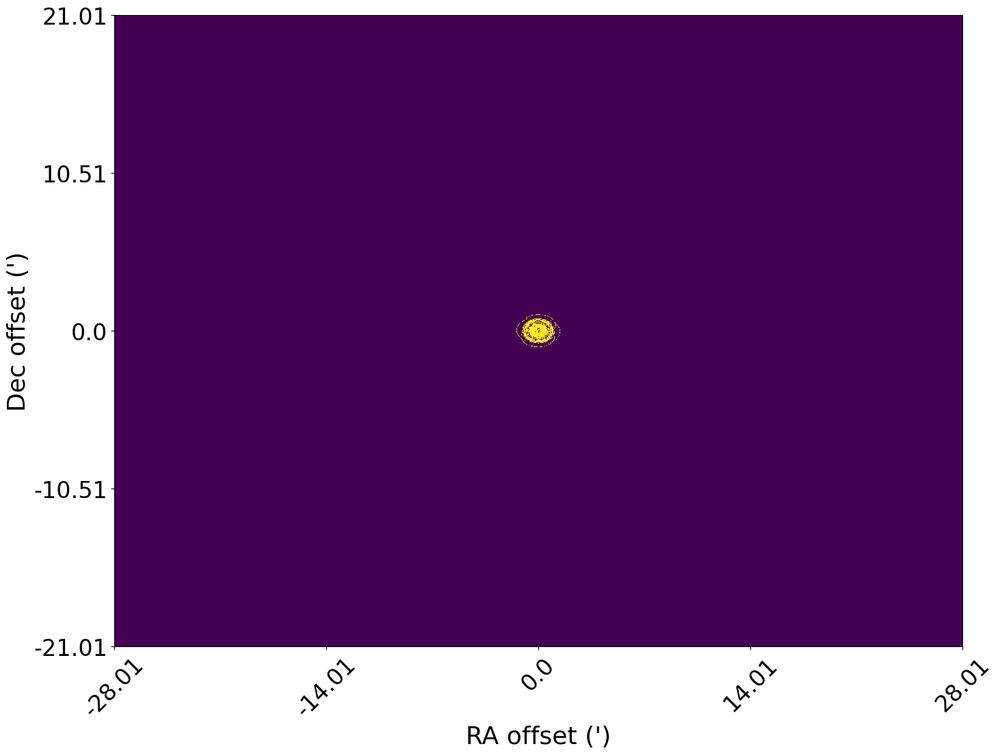

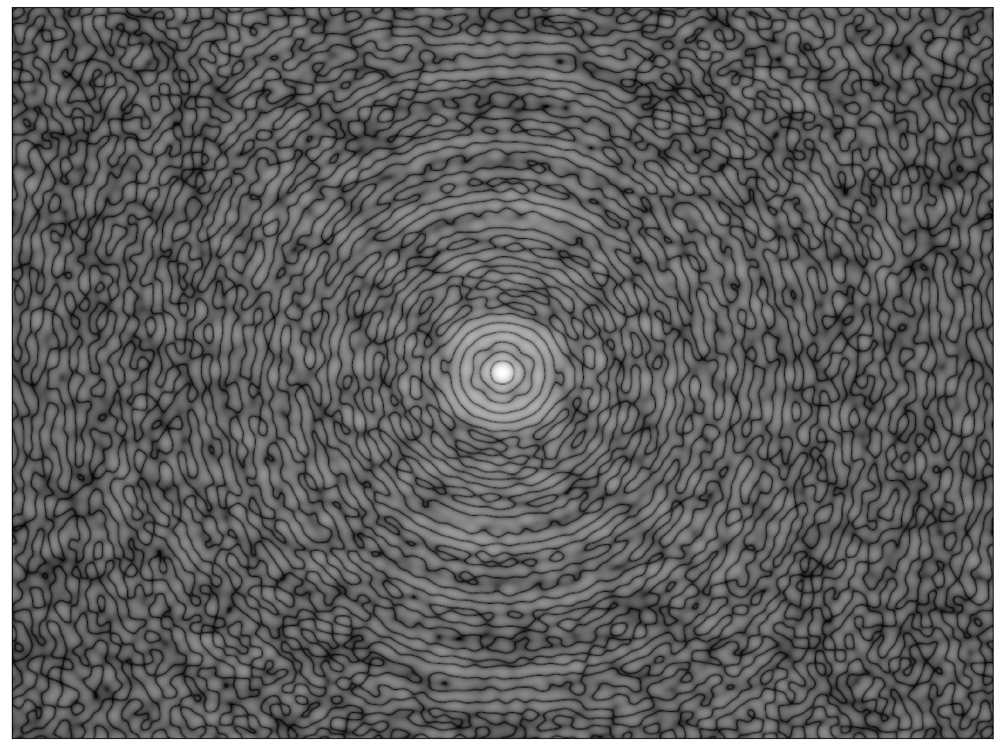

In [10]:
xpixlist = np.linspace(0,len(xft),5)
ypixlist = np.linspace(0,len(yft),5)
xpixshow = np.round( ( xpixlist - int(len(xft)/2) )*( so1.halist[2] - so1.halist[1] ),2 )
ypixshow = np.round( ( ypixlist - int(len(yft)/2) )*( so1.declist[2] - so1.declist[1] ),2 )

#uv_sample = zoom(uv_sample, zoom=0.5)
fig = plt.figure(figsize=(16,12))
plt.pcolormesh(uv_sample)
plt.xticks(xpixlist,xpixshow,fontsize=24,rotation=45)
plt.yticks(ypixlist,ypixshow,fontsize=24)
plt.xlabel("RA offset (')",fontsize=26)
plt.ylabel("Dec offset (')",fontsize=26)
plt.show()

shdbm = np.fft.fft2(uv_sample)
dbm = np.fft.fftshift(shdbm)
fig = plt.figure(figsize=(16,12))
plt.pcolormesh( np.log10(abs(dbm)+1),cmap='gray' )

#plt.xticks(xpixlist,xpixshow,fontsize=24,rotation=45)
#plt.yticks(ypixlist,ypixshow,fontsize=24)
#plt.xlabel("RA offset (')",fontsize=26)
#plt.ylabel("Dec offset (')",fontsize=26)
plt.xticks([])
plt.yticks([])
plt.show()

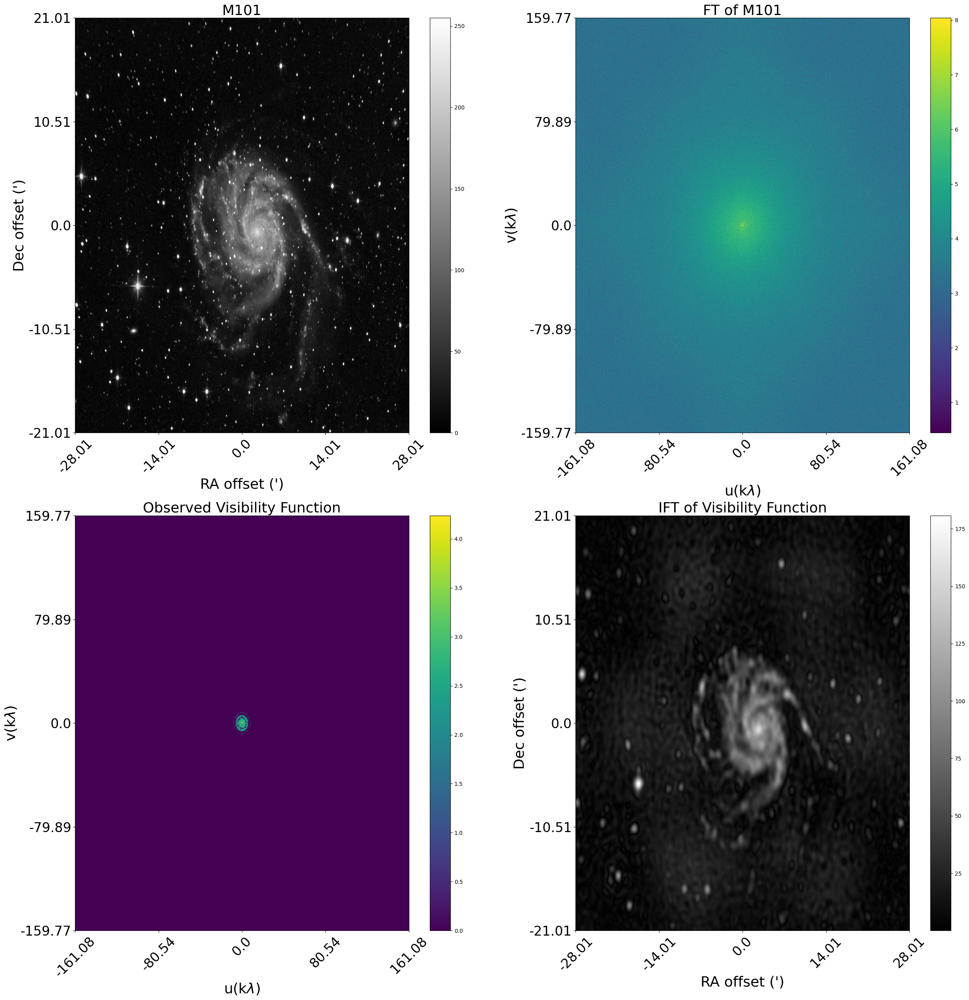

In [11]:
fig = plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.title("M101",fontsize=26)
xpixlist = np.linspace(0,len(xft),5)
ypixlist = np.linspace(0,len(yft),5)
xpixshow = np.round( ( xpixlist - int(len(xft)/2) )*( so1.halist[2] - so1.halist[1] ),2 )
ypixshow = np.round( ( ypixlist - int(len(yft)/2) )*( so1.declist[2] - so1.declist[1] ),2 )
plt.xticks(xpixlist,xpixshow,fontsize=24,rotation=45)
plt.yticks(ypixlist,ypixshow,fontsize=24)
plt.xlabel("RA offset (')",fontsize=26)
plt.ylabel("Dec offset (')",fontsize=26)
plt.pcolormesh(M101,cmap="gray")
plt.colorbar()

plt.subplot(2,2,2)
plt.title("FT of M101",fontsize=26)
plt.pcolormesh( np.log10( abs(fft2) ) )
xpixlist = np.linspace(0,len(xft),5)
ypixlist = np.linspace(0,len(yft),5)
xpixshow = np.round( ( xpixlist - int(len(xft)/2) )*( xft[2] - xft[1] ),2 )
ypixshow = np.round( ( ypixlist - int(len(yft)/2) )*( yft[2] - yft[1] ),2 )
plt.xticks(xpixlist,xpixshow,fontsize=24,rotation=45)
plt.yticks(ypixlist,ypixshow,fontsize=24)
plt.xlabel(r"u(k$\lambda$)",fontsize=26)
plt.ylabel(r"v(k$\lambda$)",fontsize=26)
plt.colorbar()


plt.subplot(2,2,3)
plt.title("Observed Visibility Function",fontsize=26)
sample_fft = fft2*uv_sample/np.sqrt(fft2.size)
plt.pcolormesh(np.log10(abs(sample_fft)+1))
plt.xticks(xpixlist,xpixshow,fontsize=24,rotation=45)
plt.yticks(ypixlist,ypixshow,fontsize=24)
plt.xlabel(r"u(k$\lambda$)",fontsize=26)
plt.ylabel(r"v(k$\lambda$)",fontsize=26)
plt.colorbar()


plt.subplot(2,2,4)
plt.title("IFT of Visibility Function",fontsize=26)
ifft = np.fft.ifftshift(sample_fft)
iimage = abs(np.fft.ifft2(ifft))*np.sqrt(ifft.size)
plt.pcolormesh( abs(iimage),cmap="gray" )
xpixlist = np.linspace(0,len(xft),5)
ypixlist = np.linspace(0,len(yft),5)
xpixshow = np.round( ( xpixlist - int(len(xft)/2) )*( so1.halist[2] - so1.halist[1] ),2 )
ypixshow = np.round( ( ypixlist - int(len(yft)/2) )*( so1.declist[2] - so1.declist[1] ),2 )
plt.xticks(xpixlist,xpixshow,fontsize=24,rotation=45)
plt.yticks(ypixlist,ypixshow,fontsize=24)
plt.xlabel("RA offset (')",fontsize=26)
plt.ylabel("Dec offset (')",fontsize=26)
plt.colorbar()

plt.show()

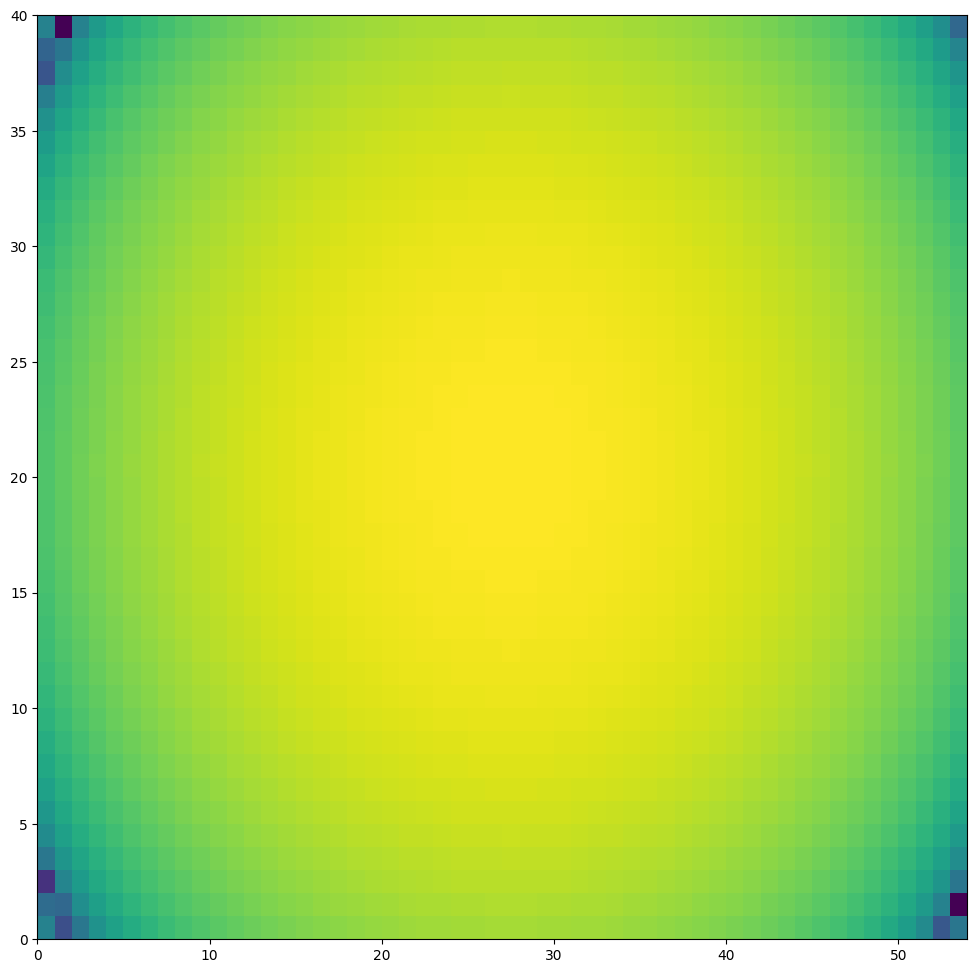

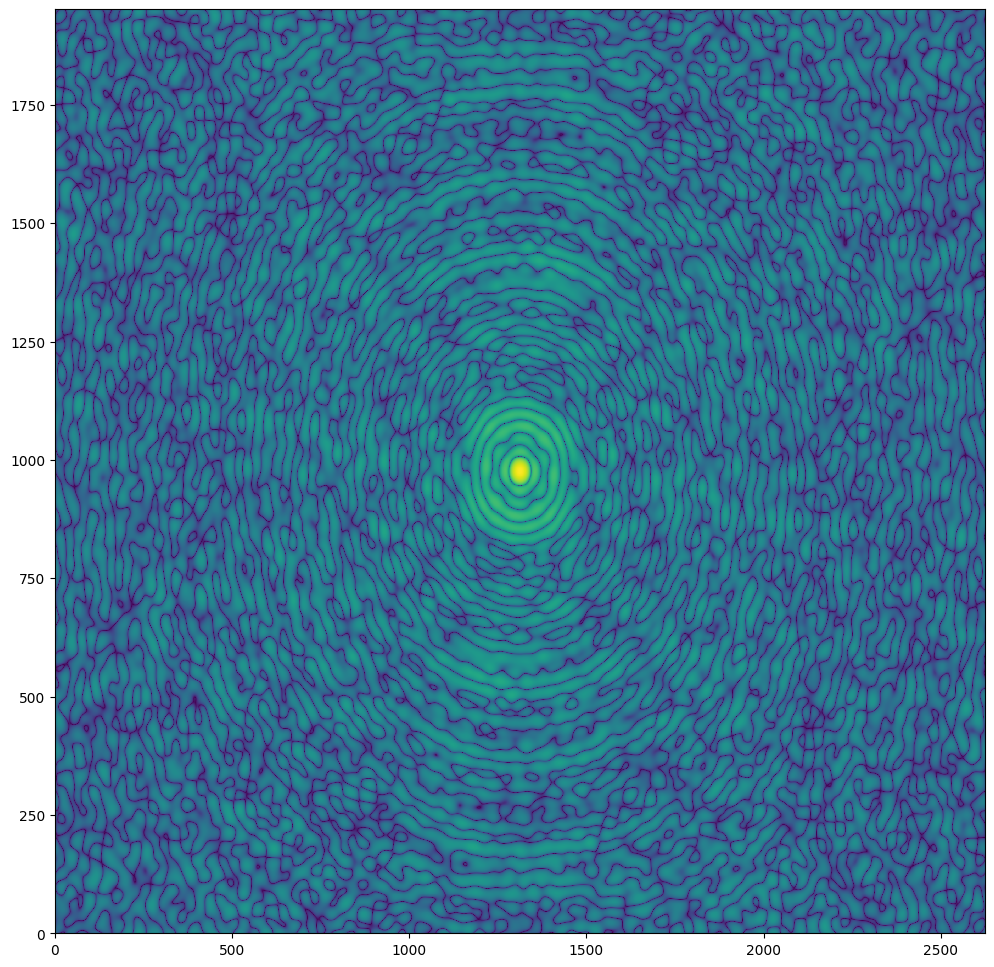

(1952, 2624) (195, 262)


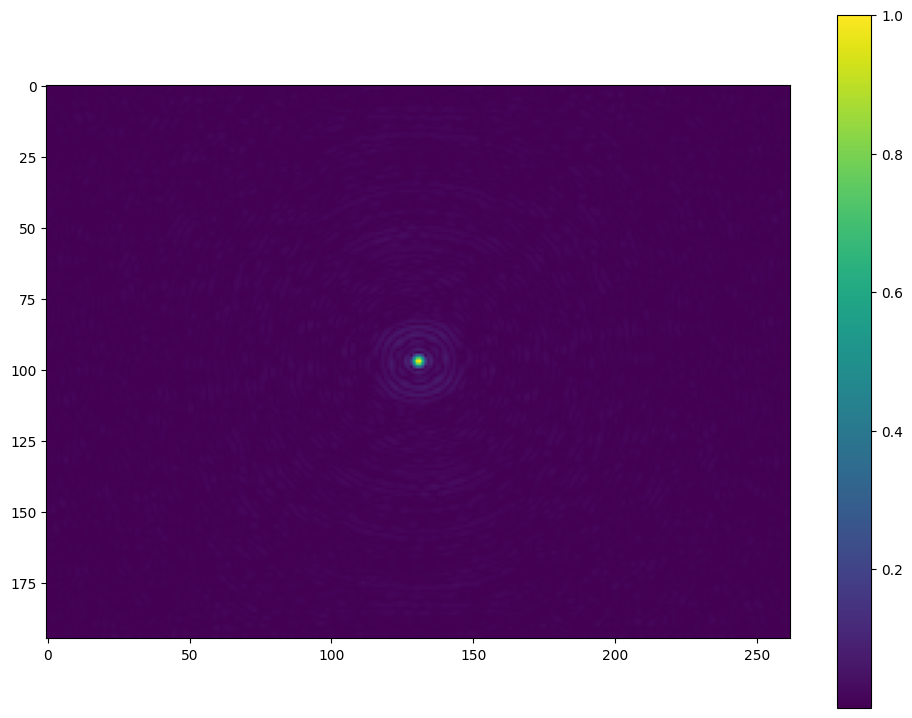

拟合参数： [ 6.36975674e+03  2.70012583e+01  2.00000925e+01  1.63608553e+01
  1.58405756e+01 -3.85754702e-02 -9.25964387e+02]


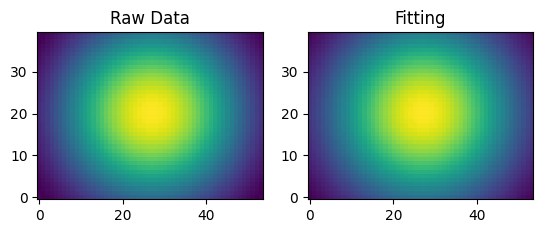

In [12]:
psf = get_CleanBeam(dbm,rate=0.02)
psf1 = get_CleanBeam(dbm,rate=1)

scale_rate = 0.1

# data
data = abs(psf)
data1 = zoom(abs(psf1), zoom=scale_rate)
data1 = data1/np.max(data1)
#data1 = abs(psf1)/np.max(abs(psf1))
print(psf1.shape,data1.shape)

fig = plt.figure(figsize=(12,9))
plt.imshow(data1)
plt.colorbar()
plt.show()

# fix the gaussion and get parameters
params = fit_gaussian(data)
print("parameters：", params)

# plot it
x = np.linspace(0, data.shape[1] - 1, data.shape[1])
y = np.linspace(0, data.shape[0] - 1, data.shape[0])
x, y = np.meshgrid(x, y)
z = gaussian_2D((x, y), *params).reshape(data.shape)
z = z - np.min(z)
z = z/np.max(z)

fig, ax = plt.subplots(1, 2)
ax[0].imshow(data, origin='lower', cmap='viridis')
ax[0].set_title("Raw Data")
ax[1].imshow(z, origin='lower', cmap='viridis')
ax[1].set_title("Fitting")
plt.show()

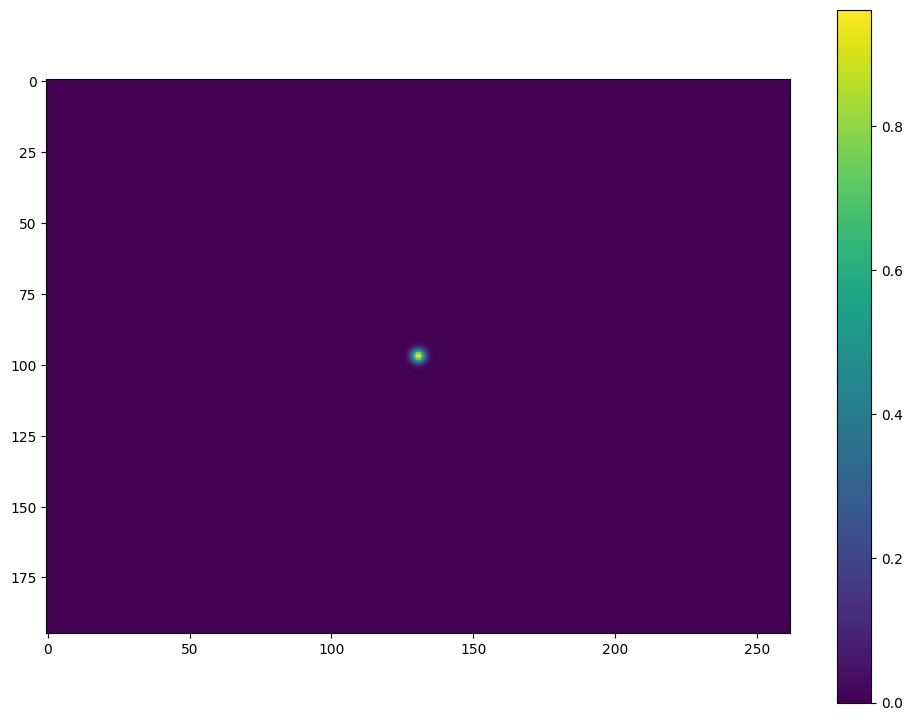

In [13]:
xbar = np.round(M101.shape[1]/2)
ybar = np.round(M101.shape[0]/2)
Fit_CleanBeam = np.zeros((M101.shape))
for i in range( M101.shape[0] ):
    for j in range( M101.shape[1] ):
        # initial parameters (amplitude, xo, yo, sigma_x, sigma_y, theta, offset)
        Fit_CleanBeam[i,j] = gaussian_2D([j+1,i+1],params[0],xbar,ybar,params[3],params[4],params[5],params[6])
        
Fit_CleanBeam = Fit_CleanBeam - np.min(Fit_CleanBeam)
Fit_CleanBeam = Fit_CleanBeam/np.max(Fit_CleanBeam)

Fit_CleanBeam = zoom(Fit_CleanBeam,zoom = scale_rate)

fig = plt.figure(figsize=(12,9))
plt.imshow(Fit_CleanBeam)
plt.colorbar()
plt.show()

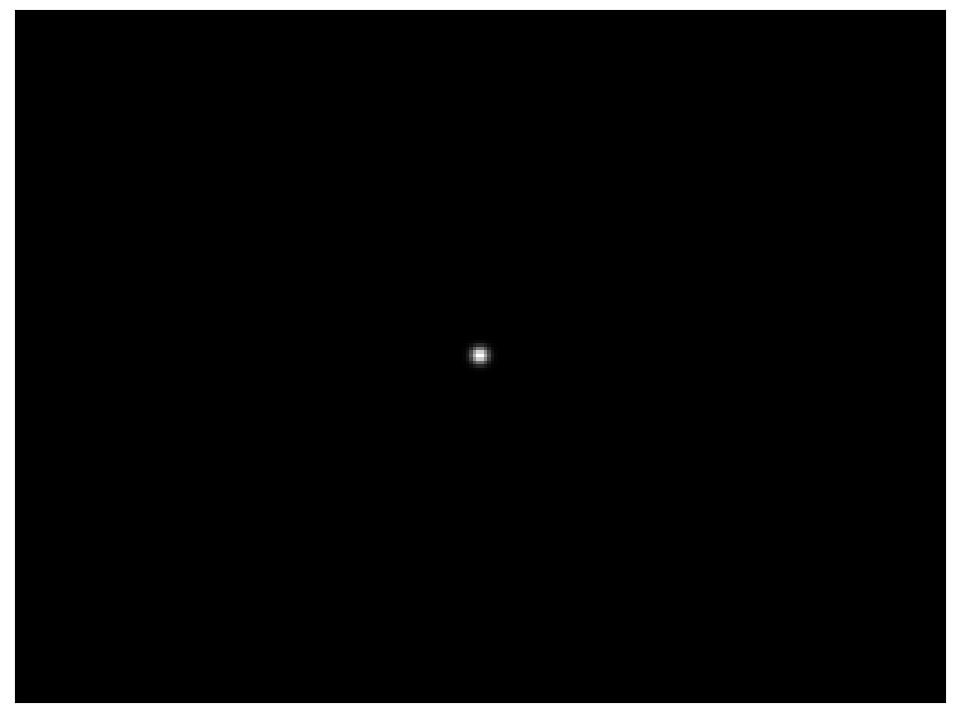

In [14]:
fig = plt.figure(figsize=(12,9))
plt.imshow(Fit_CleanBeam,cmap="gray")
#plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

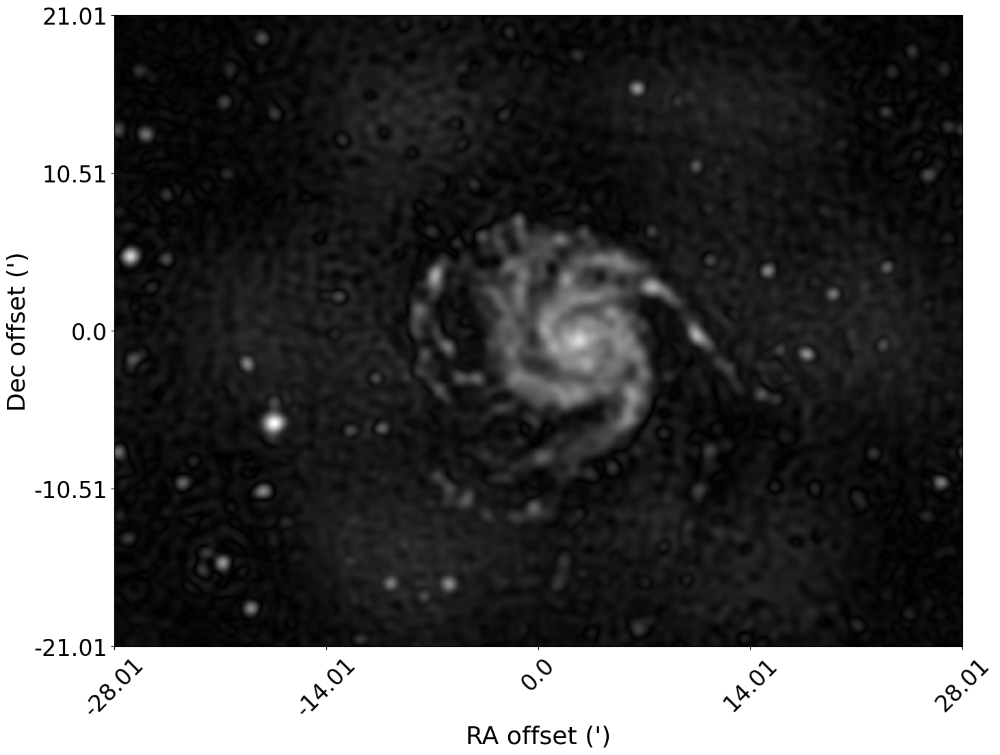

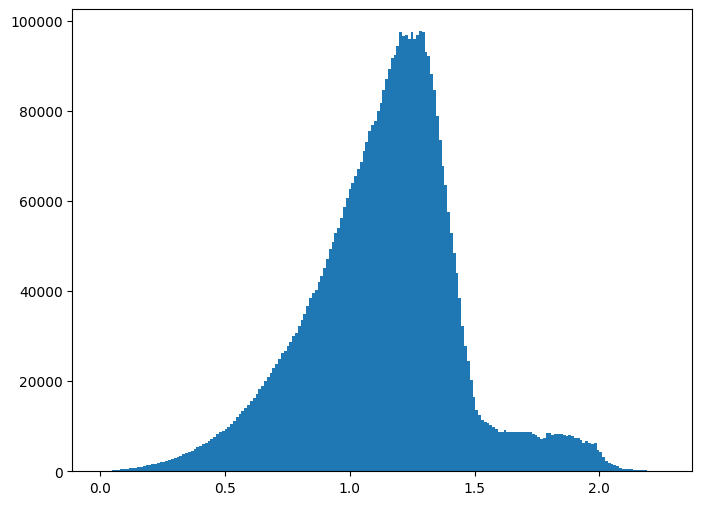

In [15]:
fig = plt.figure(figsize=(16,12))
#plt.pcolormesh( np.log(iimage[::-1]+1),cmap="gray" )
plt.pcolormesh( iimage,cmap="gray" )
plt.xticks(xpixlist,xpixshow,fontsize=24,rotation=45)
plt.yticks(ypixlist,ypixshow,fontsize=24)
plt.xlabel("RA offset (')",fontsize=26)
plt.ylabel("Dec offset (')",fontsize=26)
#plt.colorbar()
plt.show()


fimage = np.log10( iimage.flatten()+1 )
fig = plt.figure(figsize=(8,6))
plt.hist(abs(fimage),bins=200)
plt.show()

In [ ]:
time1 = time.time()
re_image = signal.convolve2d(dirty_map,data1,'same')
time2 = time.time()
print(f"spend time is {time2-time1}")

(195, 262)


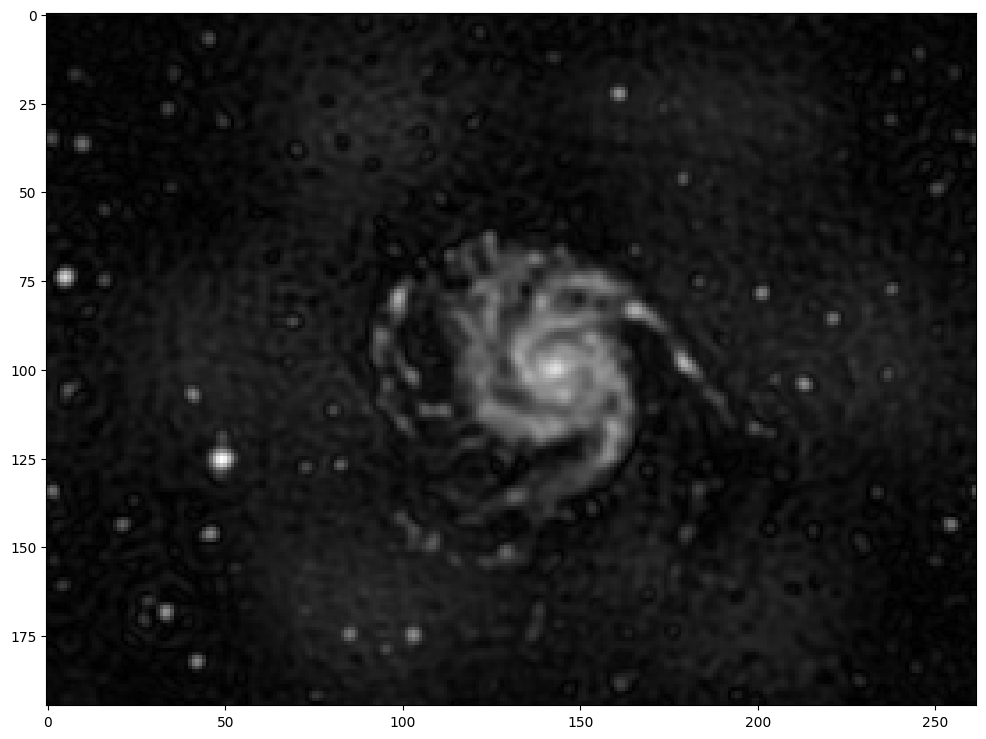

In [16]:
dirty_map = zoom(iimage,zoom=scale_rate)
print(dirty_map.shape)
fig = plt.figure(figsize=(12,9))
#plt.imshow( np.log10(dirty_map+1),cmap="gray" )
plt.imshow( dirty_map[::-1],cmap="gray" )
#plt.colorbar()
plt.show()

In [147]:
time1 = time.time()
re_image = signal.convolve2d(dirty_map,Fit_CleanBeam,'same')
time2 = time.time()
print(f"spend time is {time2-time1}")

spend time is 4.980457544326782


In [17]:
def Clean_YZP(array1,array2,gain=0.2,thresh=0,nloop=2000):
    """
    array1 is dirty map
    array2 is dirty beam
    
    """
    clean_model = np.zeros(array1.shape)
    for i in range( int(nloop) ):
        temp_array = np.zeros(array1.shape)
        maxv = np.max(array1)
        #print(maxv)
        loc = np.where(array1 == maxv)
        clean_model[loc] = clean_model[loc] + maxv*gain
        temp_array[loc] = maxv*gain
        sub_image = signal.convolve2d(temp_array,array2,'same')
        array1 = array1 - sub_image*gain
        
        if np.max(array1) < thresh:
            break
        else:
            pass
        
    return array1, clean_model

In [ ]:
resm,clmodel = Clean_YZP(dirty_map,data1,gain=0.2,nloop=18000)

fig = plt.figure(figsize=(12,9))
plt.imshow(resm,cmap="gray")
#plt.colorbar()
plt.show()

re_image = signal.convolve2d(clmodel,Fit_CleanBeam,'same')

In [ ]:
fig = plt.figure(figsize=(12,9))
#plt.imshow( np.log10(re_image+1),cmap="gray" )
plt.imshow( re_image[::-1],cmap="gray" )
#plt.colorbar()
plt.show()

In [ ]:
fig = plt.figure(figsize=(12,9))
#plt.imshow( np.log10(re_image+1),cmap="gray" )
plt.imshow( clmodel[::-1],cmap="gray" )
#plt.colorbar()
plt.show()

In [ ]:
response = signal.convolve2d(clmodel,data1,'same')

fig = plt.figure(figsize=(12,9))
#plt.imshow( np.log10(re_image+1),cmap="gray" )
plt.imshow( np.log10(response[::-1]+1),cmap="gray" )
#plt.colorbar()
plt.show()

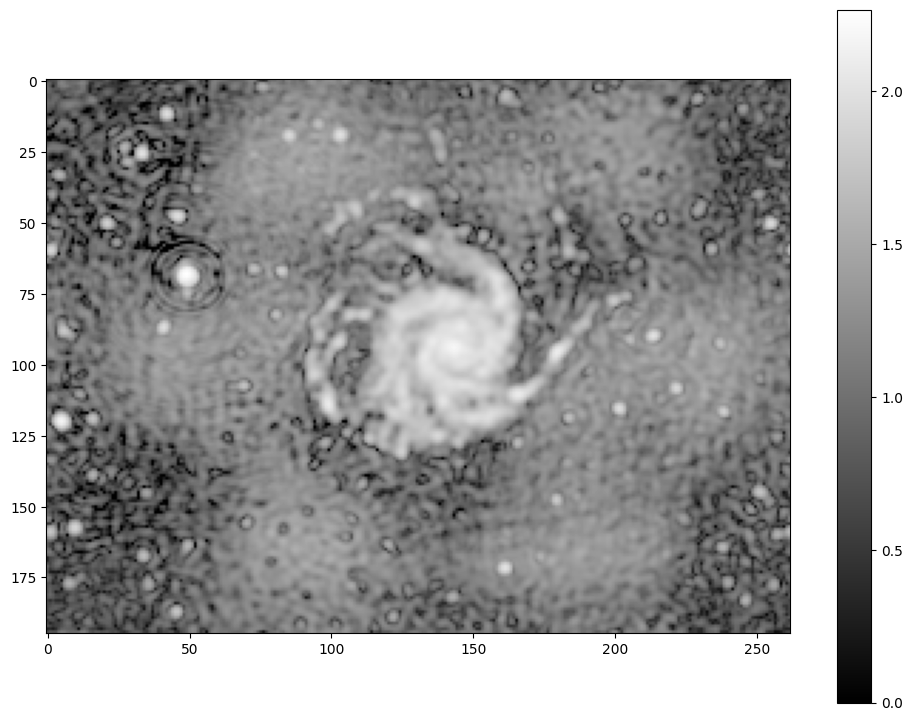

In [35]:
fig = plt.figure(figsize=(12,9))
test1 = re_image+resm
test1 = np.where( test1 < 0, 0, test1 )
plt.imshow( np.log10(test1+1),cmap="gray" )
#plt.imshow( re_image+resm,cmap="gray" )
plt.colorbar()
plt.show()